In [2]:
import functions_main
import functions_plotting
import ExoLens
import pandas as pd
import functions_main as fm
from functions_plotting import plot_cmf
import numpy as np
import matplotlib.pyplot as plt
import scipy as sp

from ExoLens import ExoLens

In [3]:
#55 planets // 50 stars // R < 2 and Teff > 4000K 
path = '/Users/kasperer/Desktop/Dissertation-/planets_list'
planet_list = pd.read_csv(path,sep=',') 

In [4]:
#32 planets // 29 stars // spectrum in ESPRESSO
path = '/Users/kasperer/Desktop/Dissertation-/planets_with_hoststar_spectra'
spectra_list = pd.read_csv(path,sep=',') 

In [7]:

mass_55 = planet_list['planet_mass']
radius_55 = planet_list['planet_radius']
mass_sigma_55 = planet_list['planet_mass_rel_err']
radius_sigma_55 = planet_list['planet_radius_rel_err']
#print(planet_list)

mass_32 = spectra_list['planet_mass']
radius_32 = spectra_list['planet_radius']
mass_sigma_32 = spectra_list['planet_mass_rel_err']
radius_sigma_32 = spectra_list['planet_radius_rel_err']
#print(spectra_list)

#convertion ratio
jup_to_earth_r = 11.209
jup_to_earth_m = 317.83

#convert them to earth units

#1st list
#radius and mass in earth units
radius_earth_55 = radius_55 * jup_to_earth_r
mass_earth_55 = mass_55 * jup_to_earth_m

#rel. error in earth units
radius_sigma_earth_55 = radius_sigma_55 * radius_earth_55
mass_sigma_earth_55 = mass_sigma_55 * mass_earth_55

#2nd list
radius_earth_32 = radius_32 * jup_to_earth_r
mass_earth_32 = mass_32 * jup_to_earth_m

radius_sigma_earth_32 = radius_sigma_32 * radius_earth_32
mass_sigma_earth_32 = mass_sigma_32 * mass_earth_32


#inputs for ExoLens : [M, sigM]

#1st list
mass_input_55 = (mass_earth_55, mass_sigma_earth_55)
radius_input_55 = (radius_earth_55,radius_sigma_earth_55)

#2nd list
mass_input_32 = (mass_earth_32,mass_sigma_earth_32)
radius_input_32 = (radius_earth_32,radius_sigma_earth_32)

print(type(mass_input_32)) #needs to be tuple
print(type(radius_input_32))
#print(mass_sigma_earth)
#print(radius_input_32[1])


<class 'tuple'>
<class 'tuple'>


In [9]:
#print(spectra_list)

In [4]:
#ExoLens(mass, radius, planet_fname = ' ', sratios = [], plot_flag = 1)

#(1) Planetary radius vs CMF
#(2) Planetary mass vs CMF
#(3) Mass vs Radius with a contour of CMF
#(4) PDF's for planetary CMF and CMF star (if CMF star is provided).

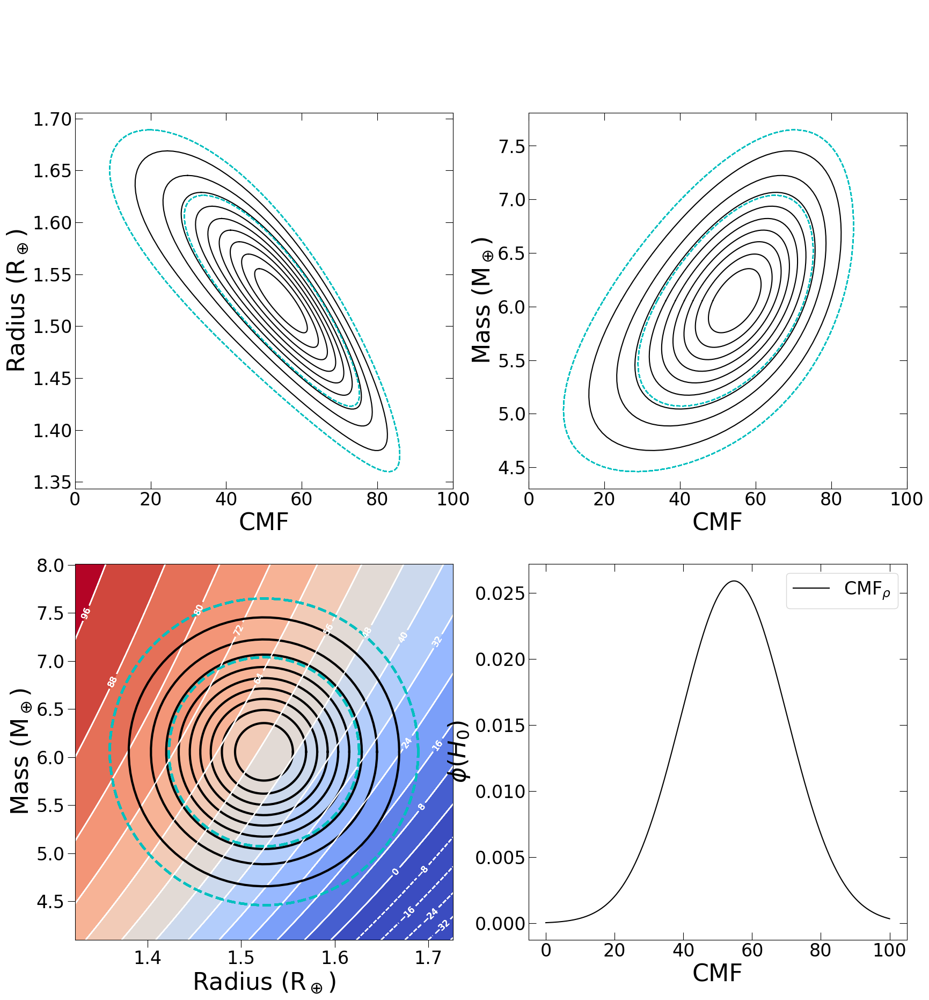

In [11]:
mass_input = (mass_earth_32.iloc[1], mass_sigma_earth_32.iloc[1])
radius_input = (radius_earth_32.iloc[1], radius_sigma_earth_32.iloc[1])

cmf_planet1, cmf_star, probability = ExoLens(mass_input, radius_input)

In [12]:
print("planetary core mass fraction and uncertainties:",cmf_planet1)
#planetary core mass fraction and uncertainties
#[CMF, sigCMF upper, sigCMF lower]

#OTHER OUTPUTS ARE NaN because we have no metallicity from the star

planetary core mass fraction and uncertainties: (54.748206848672446, 13.767430813778027, 15.40832828893744)


In [13]:
#PLANET 1:
print("planet 1 has mass:", mass_earth_32[1], "M_earth and radius",radius_earth_32[1],'R_earth and cmf of',cmf_planet1[0],"%")
#print("planet 2 has mass:", mass_earth[1], "M_earth and radius",radius_earth[1],'R_earth and cmf of',cmf_planet1[0],"%")


planet 1 has mass: 6.0546615 M_earth and radius 1.524424 R_earth and cmf of 54.748206848672446 %


In [ ]:
cmf_planet = []


In [6]:
#this is calling it for all 55 planets
#for i in range(len(mass_earth)):
 #   mass_input = (mass_earth.iloc[i], mass_sigma_earth.iloc[i])
  #  radius_input = (radius_earth.iloc[i], radius_sigma_earth.iloc[i])
    
  #  ExoLens(mass_input, radius_input)

In [9]:
#AGAIN WITH MORE INPUT: sratios: the host star's metallicity [FeMg, sigFeMg,SiMg,sigSiMg]

FeH = planet_list["stellar_metallicity"]
#sigFeH = planet_list["stellar_metallicity_upper"]

#stellar metallicity upper = stellar metallicity lower
#stellar metallicity = Fe/H ---> its not FeMg


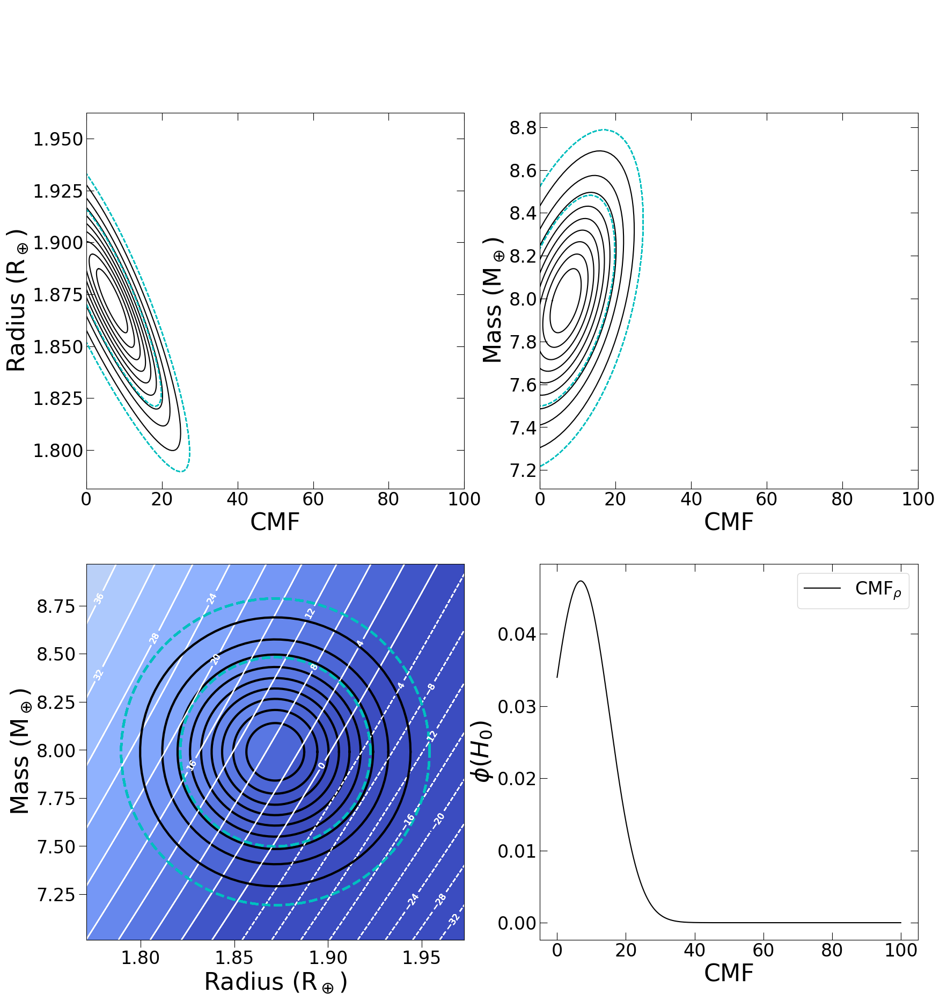

0 (7.9902462, 0.32577574999999925) (1.871903, 0.033626999999999956)


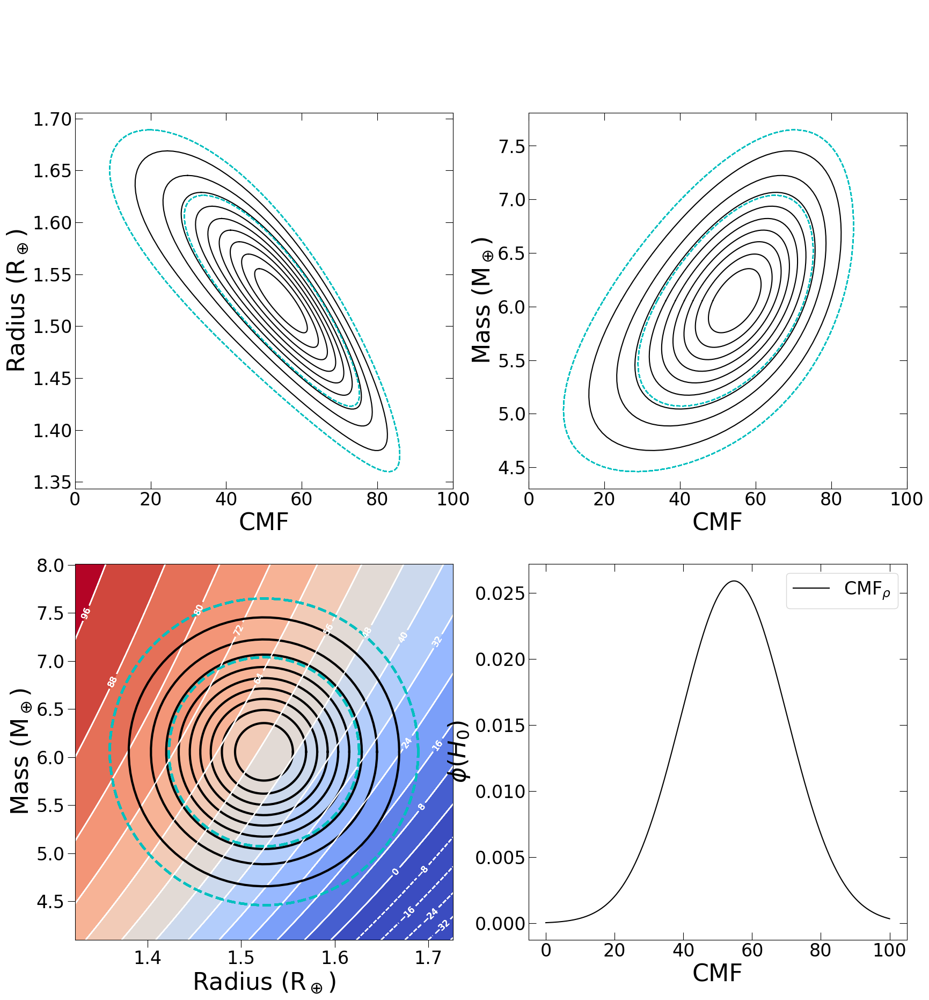

1 (6.0546615, 0.6515514999999973) (1.524424, 0.06725399999999995)


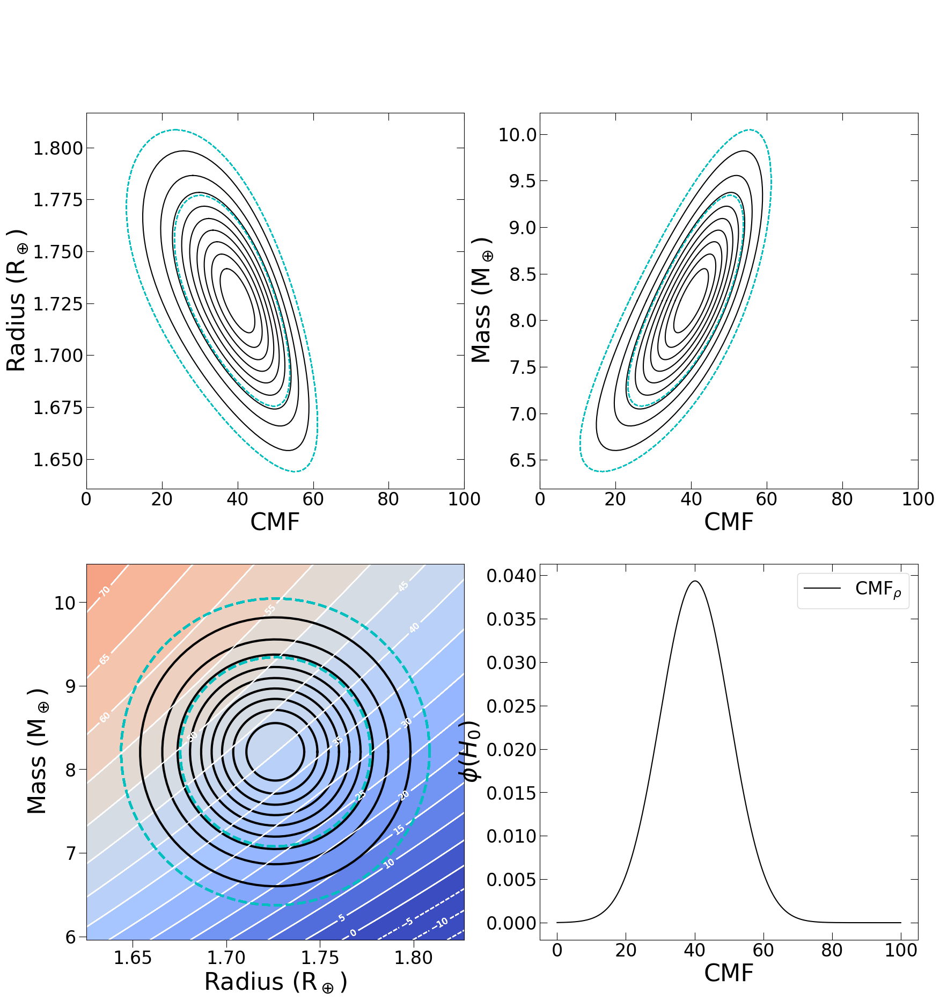

2 (8.2095489, 0.7500787999999999) (1.726186, 0.03362699999999986)


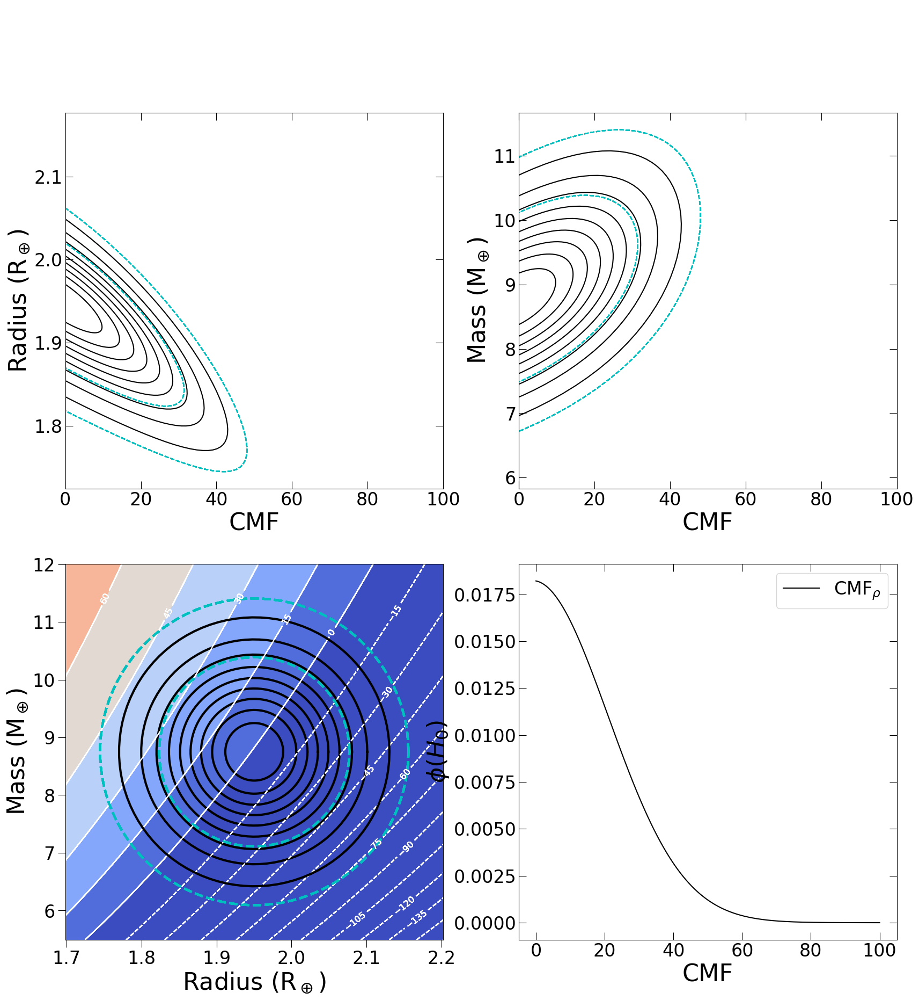

3 (8.749859899999999, 1.085389450000004) (1.9503659999999998, 0.08406749999999986)


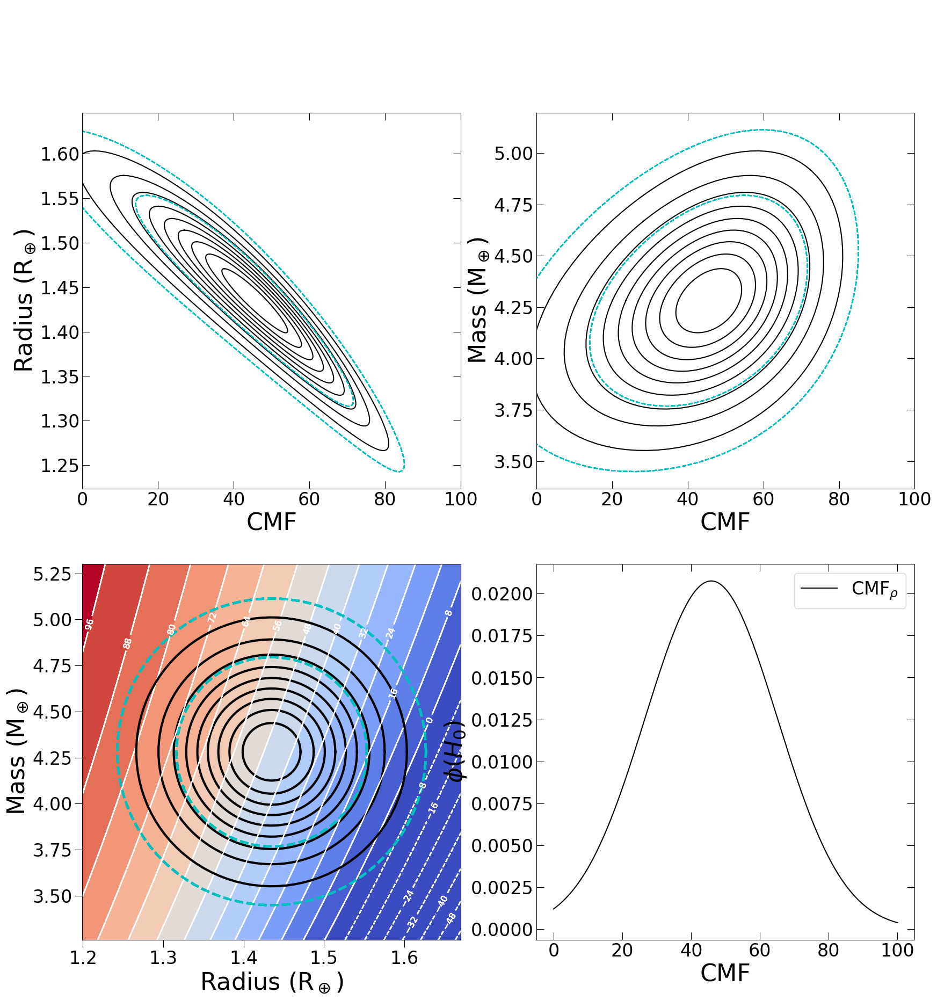

4 (4.2811701, 0.3400780999999997) (1.434752, 0.078463)


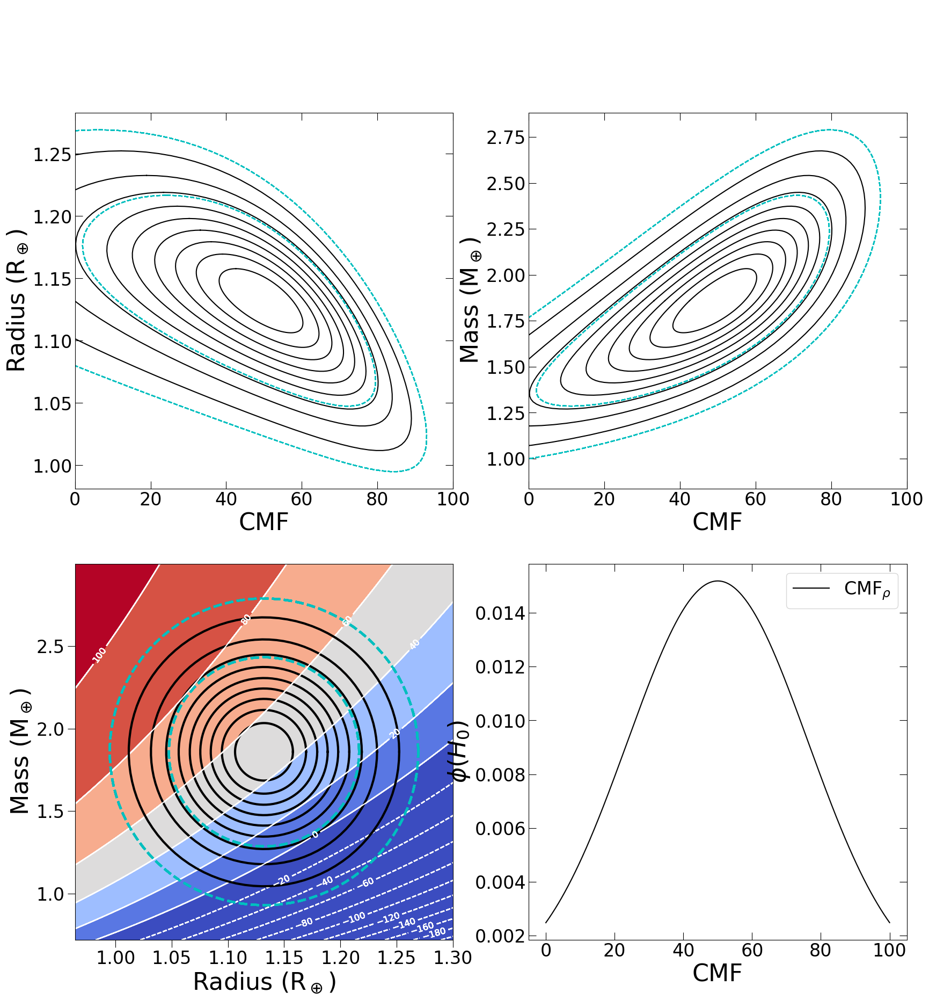

5 (1.8593055, 0.3798068499999995) (1.132109, 0.056045)


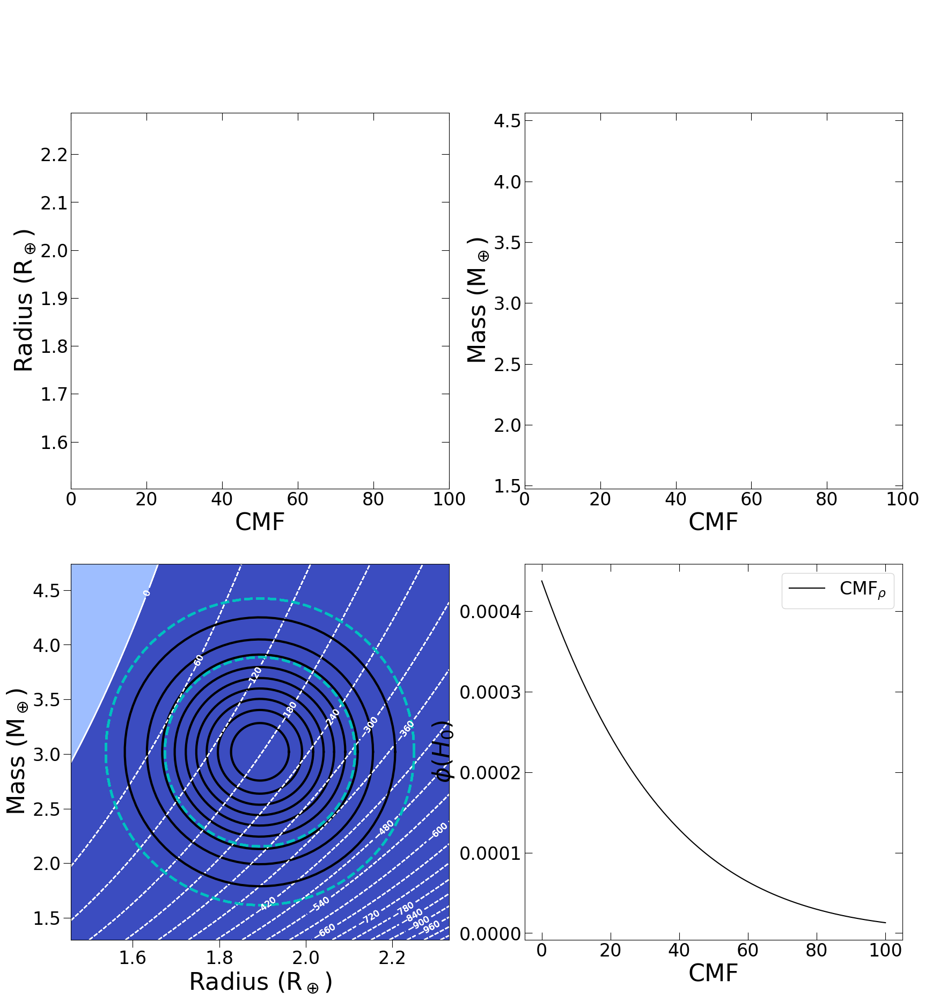

6 (3.0193849999999998, 0.5736831499999999) (1.8943210000000001, 0.14571699999999996)


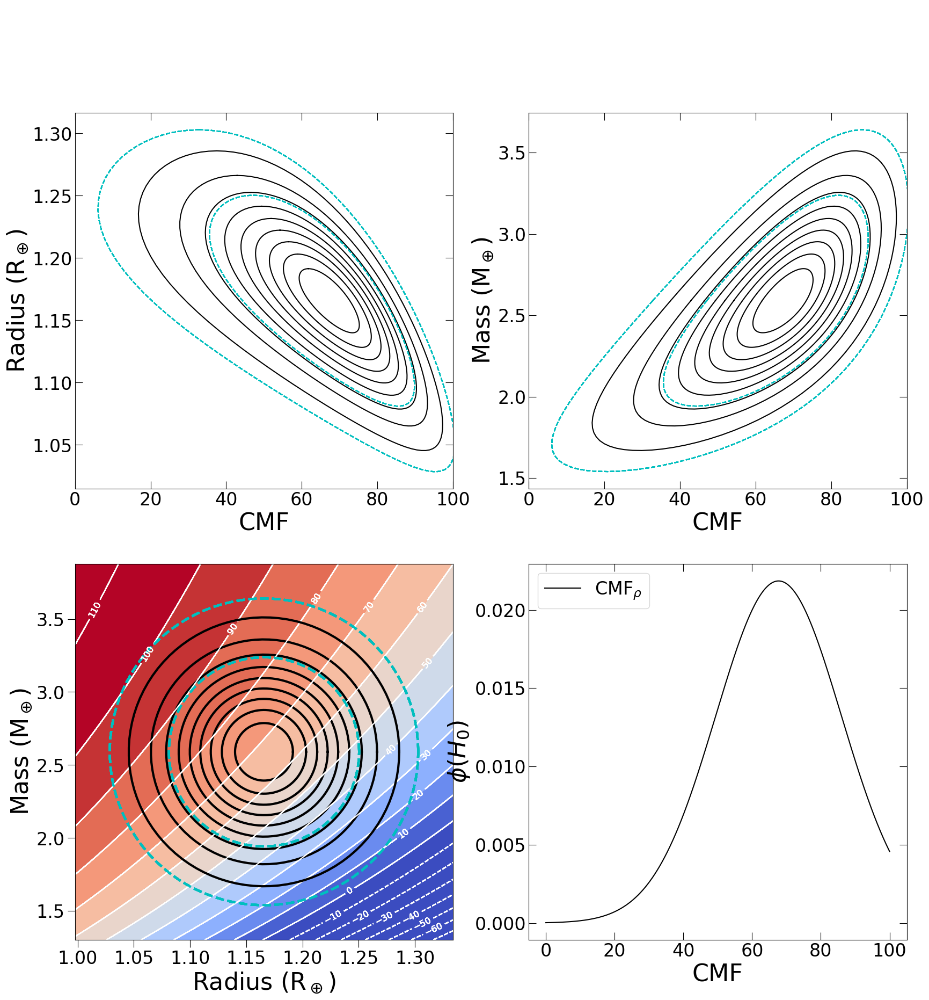

7 (2.5903145, 0.42907049999999974) (1.1657359999999999, 0.05604499999999991)


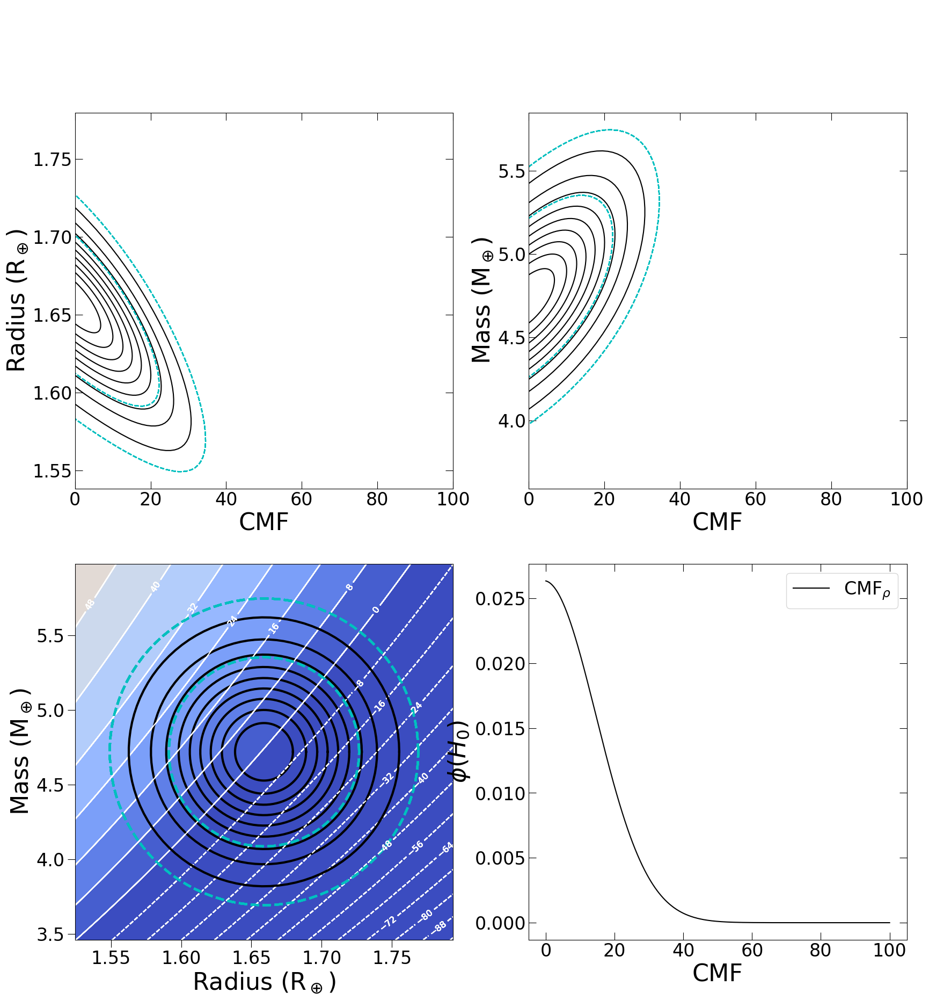

8 (4.7197755, 0.41953559999999956) (1.6589319999999999, 0.04483599999999995)


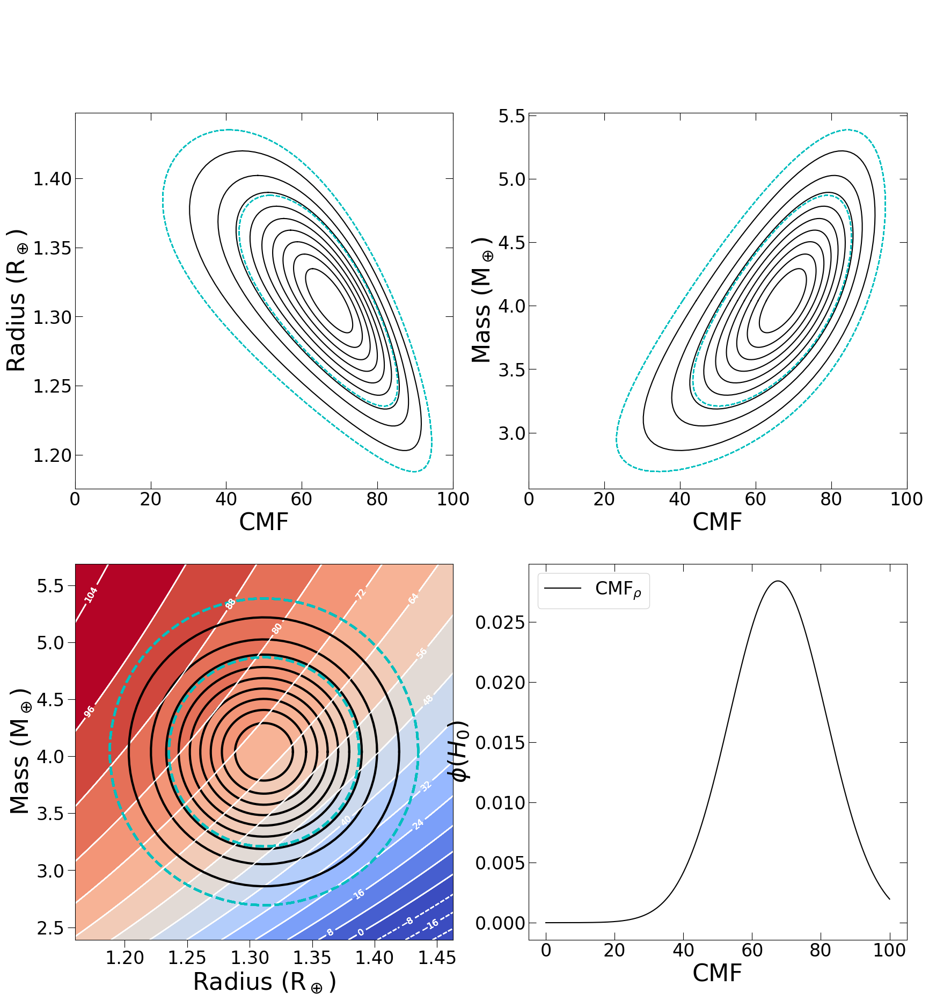

9 (4.0396193, 0.5498458999999994) (1.311453, 0.05044049999999992)


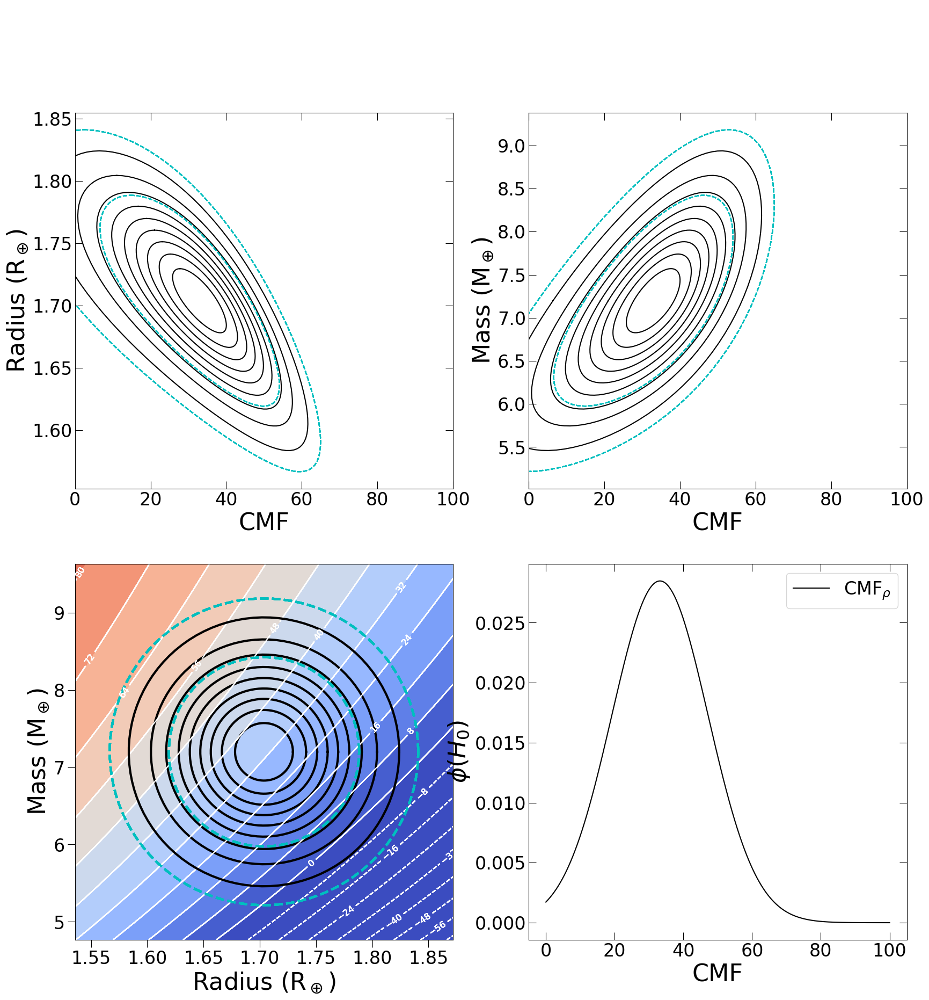

10 (7.1988495, 0.8104665000000025) (1.703768, 0.05604499999999989)


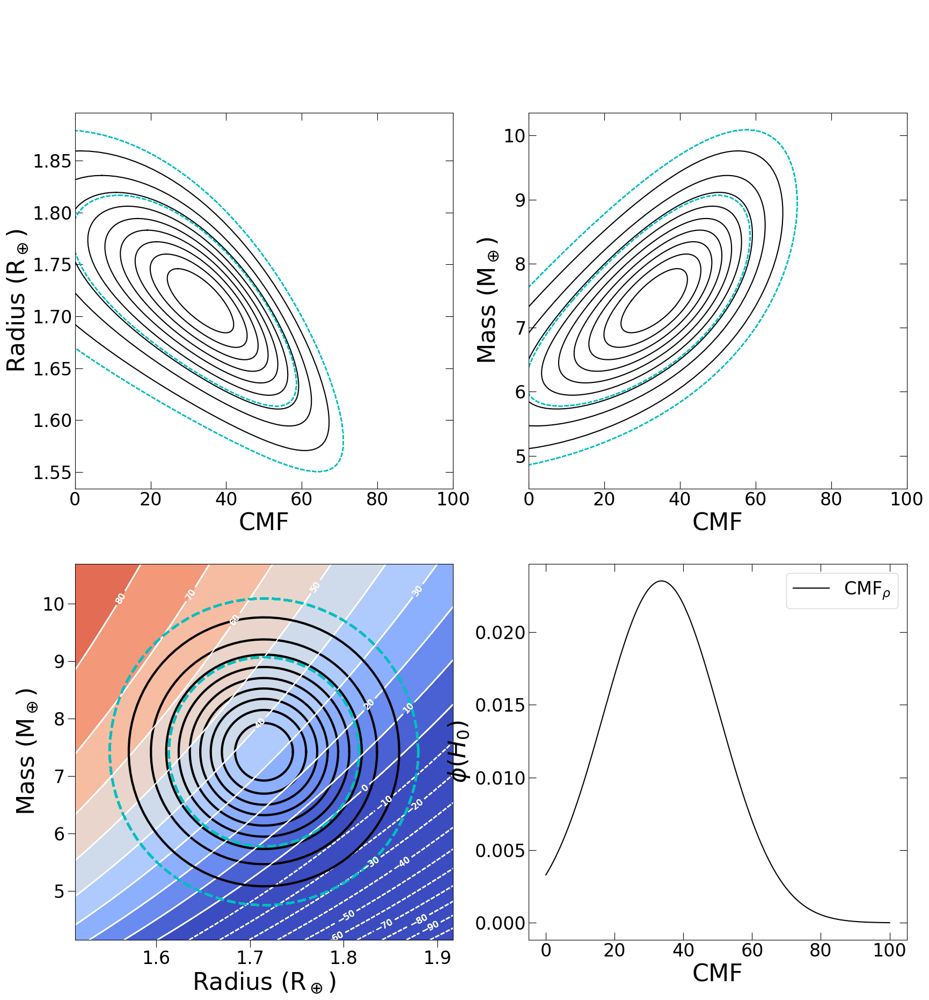

11 (7.421330499999999, 1.0901569000000013) (1.714977, 0.067254)


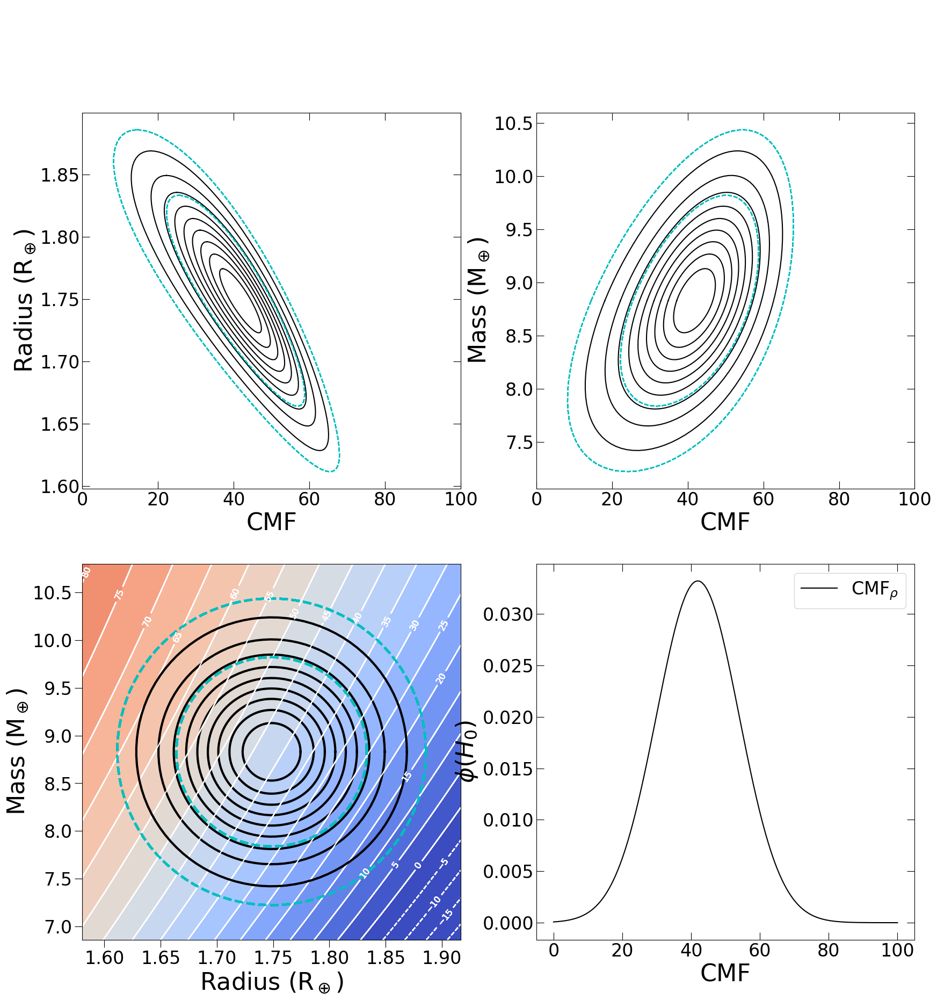

12 (8.829317399999999, 0.6563189499999996) (1.748604, 0.056044999999999914)


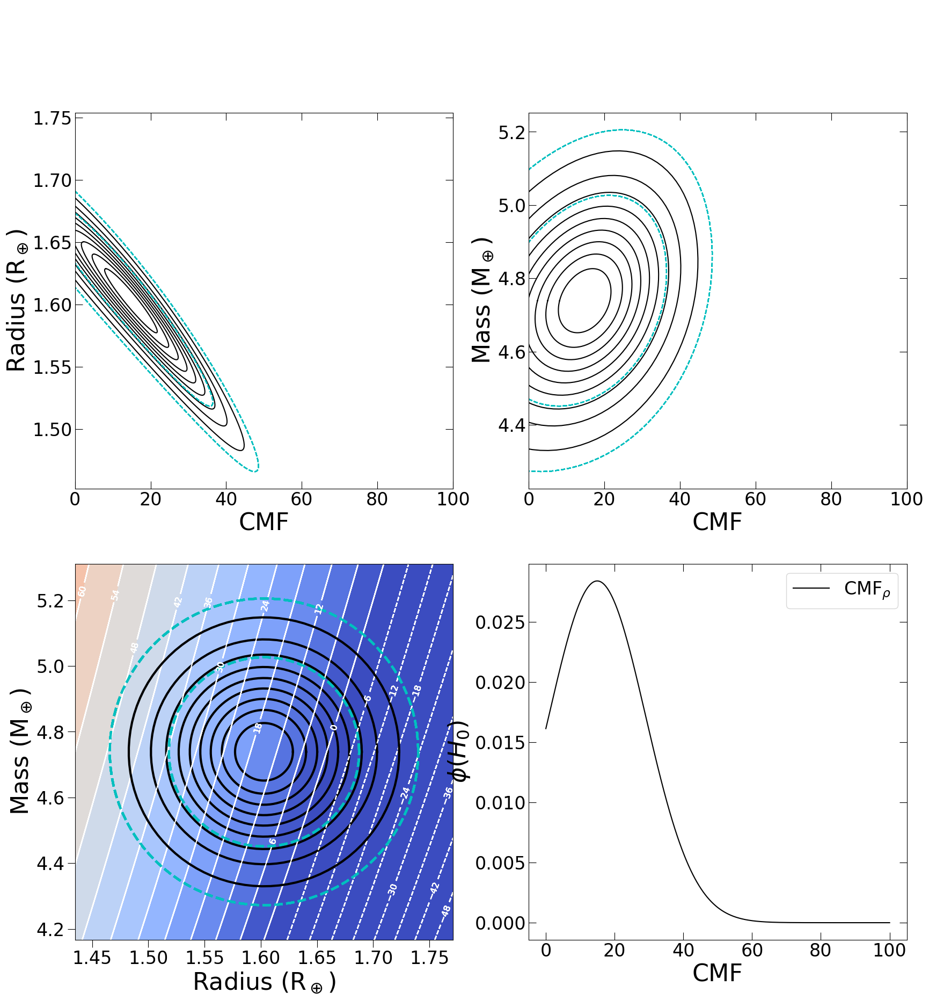

13 (4.7388452999999995, 0.19069799999999987) (1.6028869999999997, 0.05604499999999989)


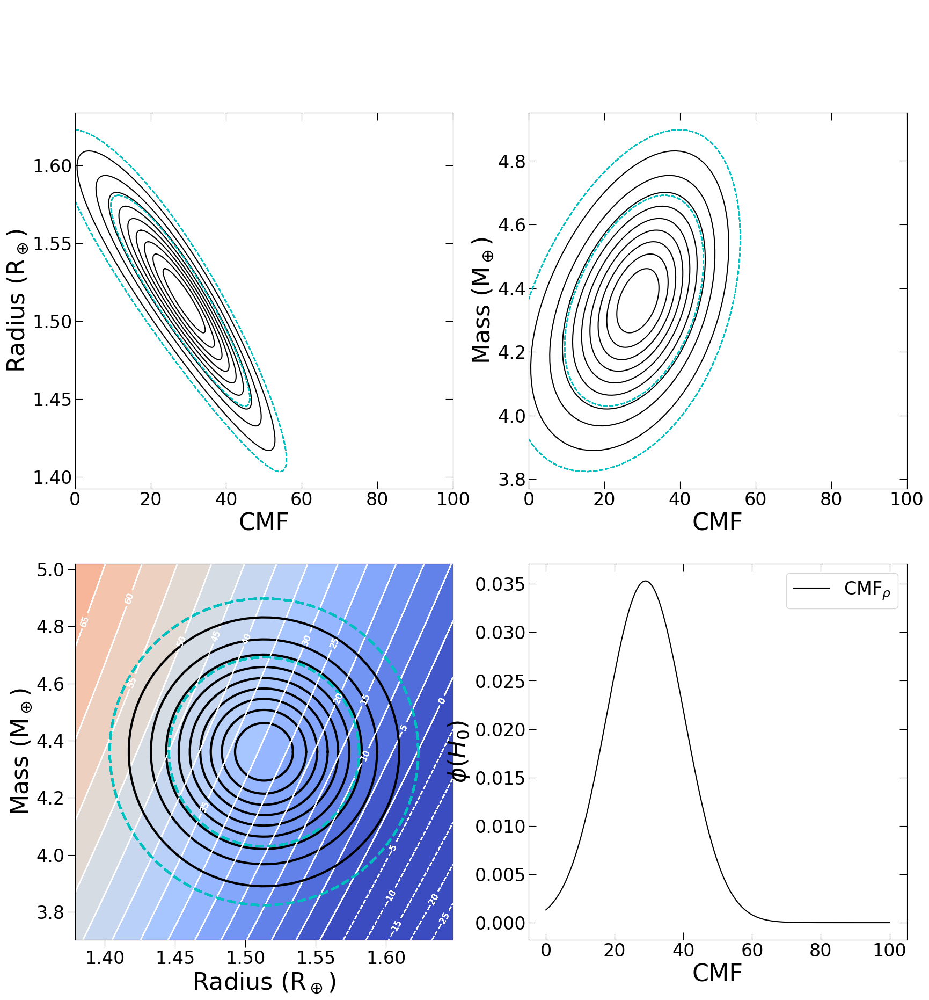

14 (4.3606276, 0.21930269999999968) (1.513215, 0.04483599999999995)


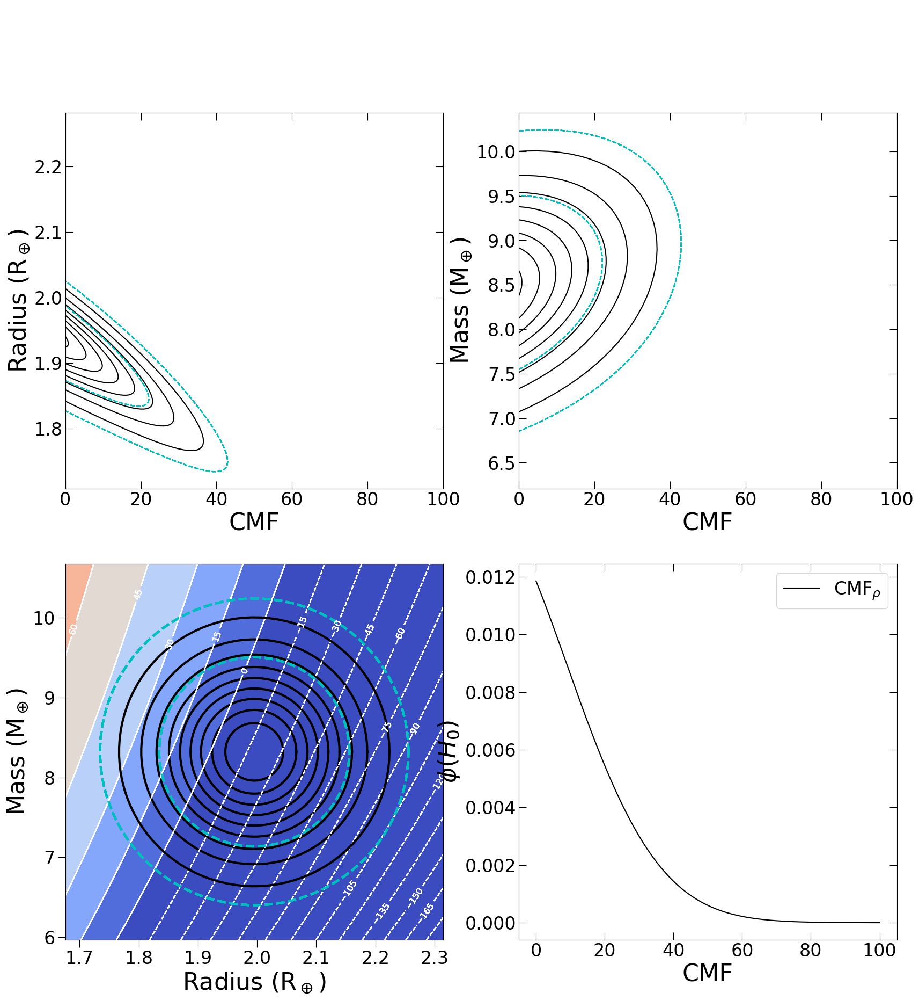

15 (8.320789399999999, 0.7850400999999992) (1.995202, 0.10648549999999994)


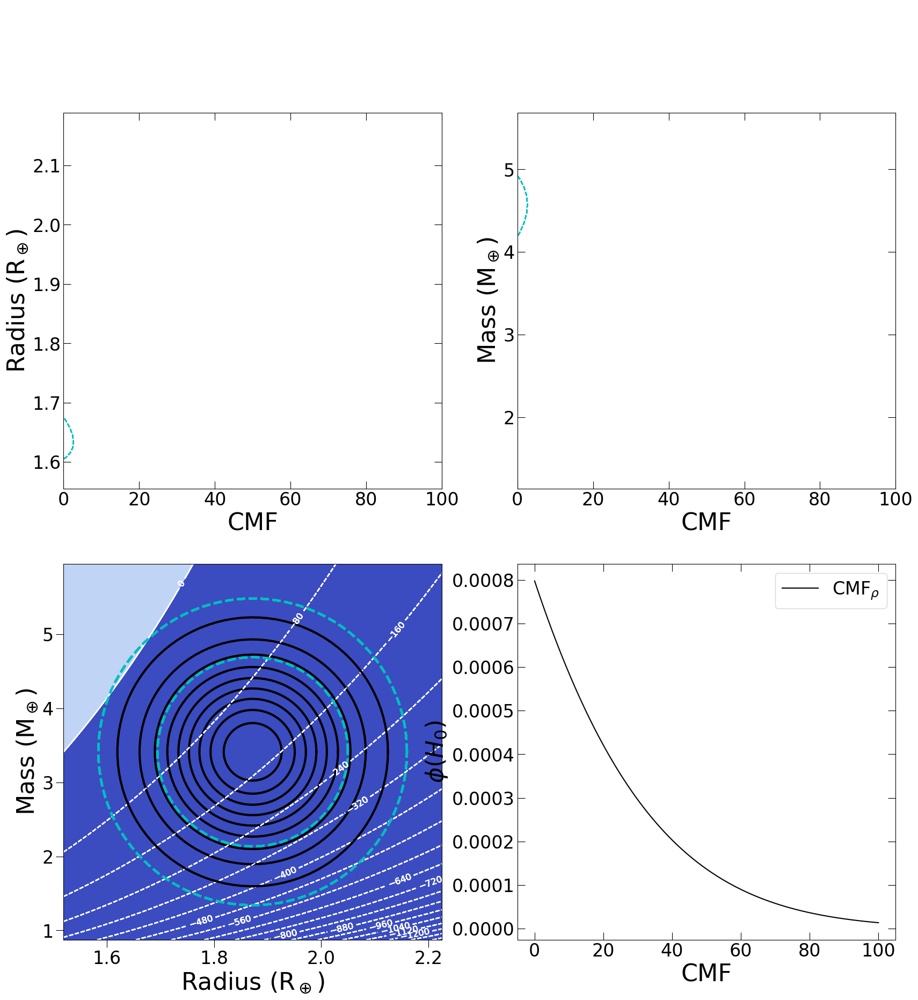

16 (3.4103158999999996, 0.8454277999999986) (1.871903, 0.11769449999999984)


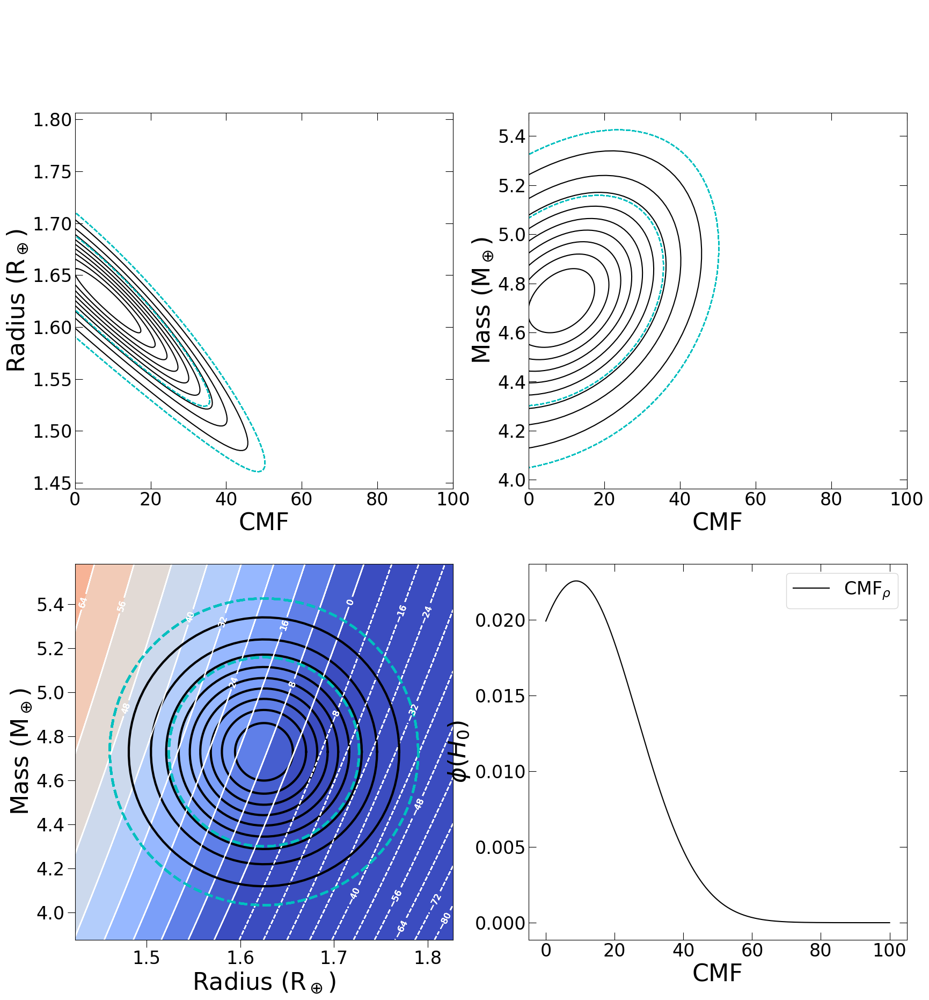

17 (4.7293104, 0.28445784999999957) (1.6253049999999998, 0.06725399999999986)


In [ ]:
cmf_planet_55 = []
sigcmf_upper_55 = []
sigcmf_downer_55 = []

for i in range(len(mass_earth_55)):
    mass_input = (mass_earth_55.iloc[i], mass_sigma_earth_55.iloc[i])
    radius_input = (radius_earth_55.iloc[i], radius_sigma_earth_55.iloc[i])
    
    cmf_planet1, cmf_star, probability = ExoLens(mass_input, radius_input)

    print(i,mass_input,radius_input)
    
    
    cmf_planet_55.append(cmf_planet1[0])
    sigcmf_upper_55.append(cmf_planet1[1])
    sigcmf_downer_55.append(cmf_planet1[2])

In [ ]:
#cmf_plant_55 = 55 planets 

In [55]:
print(type(cmf_planet))
print(len(radius_earth))
print(type(radius_earth))
radius_list = radius_earth.tolist()
mass_list = mass_earth.tolist()

# Print the list to verify
print(type(radius_list))

print(radius_list)
print(cmf_planet)

<class 'list'>
55
<class 'pandas.core.series.Series'>
<class 'list'>
[1.871903, 1.524424, 1.726186, 1.9503659999999998, 1.434752, 1.132109, 1.8943210000000001, 1.1657359999999999, 1.6589319999999999, 1.311453, 1.703768, 1.714977, 1.748604, 1.6028869999999997, 1.513215, 1.995202, 1.871903, 1.6253049999999998, 1.6140959999999998, 1.580469, 1.815858, 1.692559, 1.513215, 1.748604, 1.714977, 1.5916779999999997, 1.6589319999999999, 1.468379, 1.5916779999999997, 1.423543, 1.524424, 2.028829, 1.7710219999999999, 1.6365139999999998, 1.6365139999999998, 1.502006, 1.199363, 1.8943210000000001, 1.5916779999999997, 1.300244, 1.4795880000000001, 1.401125, 1.804649, 1.6253049999999998, 1.6701409999999999, 1.3674979999999999, 1.401125, 1.277826, 1.1657359999999999, 2.01762, 1.3674979999999999, 1.995202, 1.703768, 1.827067, 2.040038]
[6.862802632057777, 54.748206848672446, 40.142837334169045, -0.9737432193351334, 45.831951520933806, 50.00753708396957, -176.97246656561651, 67.69996192775973, -0.56304532

In [ ]:
#3 planets: 1 biggest, 1 smallest, 1 middle 
#3 uncertaintes for R/M: 0.1%: (fix for M and let unc of R rise up to 8%)
        #other way around:, fix unc_R (let unc_M evolve)
    #if that changes mean(CMF)
    #plot: unc_R vs. cmf & unc_M vs. cmf

#CUT DOWN TO 32 PLANETS: ESPRESSO SPECTRA
#metallicity for some stars available from reference in document
#Fe = 7.46 ± 0.04 aus dem paper aus der mail

#calculate the ratio
#calculate the errors for the ratio (error proapgation)



#exoplex: 

In [ ]:
#

<ErrorbarContainer object of 3 artists>

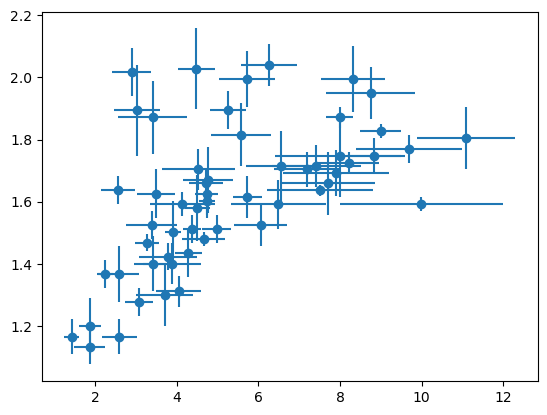

In [91]:

yerr = [radius_sigma_earth]
xerr = [mass_sigma_earth]
plt.errorbar(mass_list,radius_list,yerr=yerr,xerr=xerr,fmt='o')

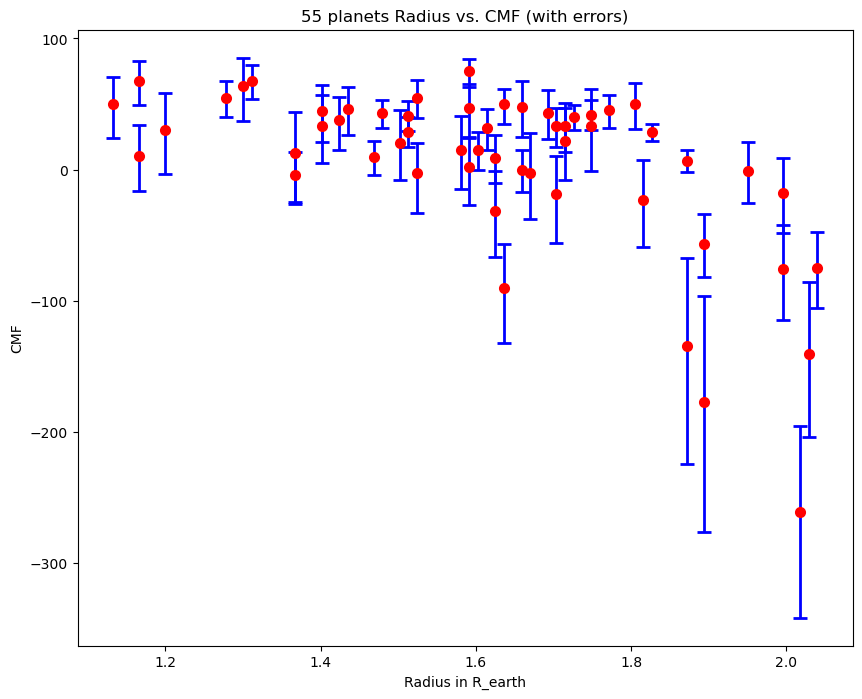

In [86]:
plt.figure(figsize=(10,8))
plt.title('55 planets Radius vs. CMF (with errors)')
#plt.scatter(radius_list,cmf_planet,color='black')

yerr = [sigcmf_downer, sigcmf_upper]
plt.errorbar(radius_list, cmf_planet, yerr=yerr, fmt='o', color='r', capsize=5, elinewidth=2, markeredgewidth=2,ecolor='b')

plt.xlabel('Radius in R_earth')
plt.ylabel('CMF')
plt.show()

Text(0, 0.5, 'CMF')

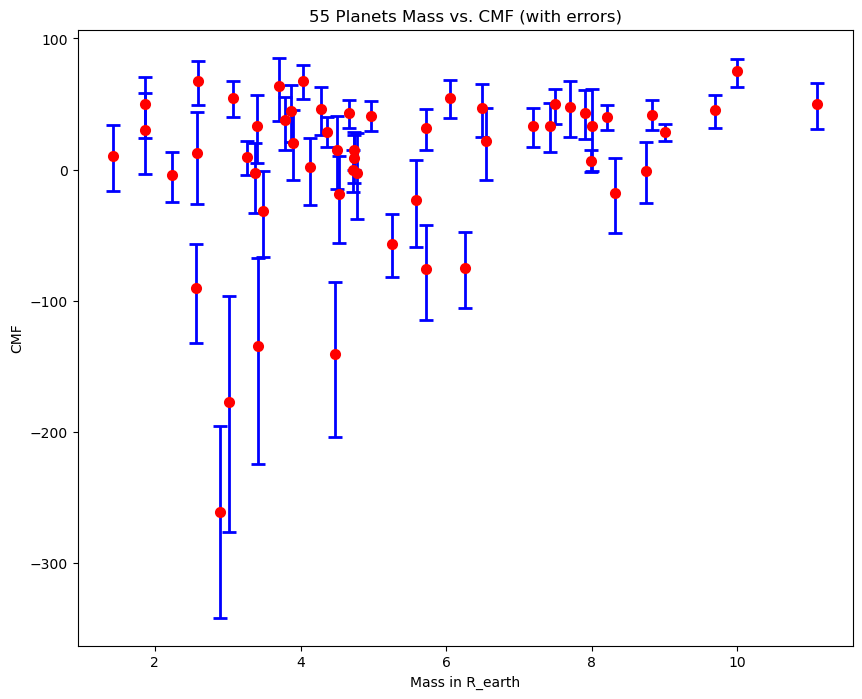

In [87]:
plt.figure(figsize=(10,8))
plt.title('55 Planets Mass vs. CMF (with errors)')
yerr = [sigcmf_downer, sigcmf_upper]
plt.errorbar(mass_list, cmf_planet, yerr=yerr, fmt='o', color='r', capsize=5, elinewidth=2, markeredgewidth=2,ecolor='b')

plt.xlabel('Mass in R_earth')
plt.ylabel('CMF')